# Scalar Wave Equation 
# Second Order in Time with Damping, Non Linearity and Periodic Forcing 
# Harmonic Balancing vs. Time Integration

## To do 
1. entire review
2. compare harmonic balance solution with time-integration 

## Import Packages 

In [1]:
using LinearAlgebra
using DifferentialEquations
using SparseArrays
using FFTW 
using BenchmarkTools 
using Plots 

## Section 1: Introduction 

Here we study the scalar (acoustic pressure) second-order non-linear wave equation with damping and periodic forcing. We include damping (and thus the disappearance of the homogeneous solution over time) and non-linear terms (and thus the apperance of higher order harmonics). The non-linearity introduced here is kind off artifical. It serves illustration purposes. More realistic models for damping will be introduced later. We consider the following four cases (or scenarios) (numbering similar to the mass-spring-damper systems)
  
1. <b>Case-(1/4)</b>: linear, no external forcing and no damping (Natural undamped vibration of a linear string. Frequencies present in the vibration are determined by the initial conditions imposed due to superposition in a linear setting); 
1. <b>Case-(2/4)</b>: linear, including external forcing and excluding damping (Forced vibration of a linear string. After initial transients, the frequency of the vibration is equal to the frequency of the forcing);
1. <b>Case-(3/4)</b>: linear, including external forcing and including damping (Natural damped vibration of a linear string. All frequencies are damped albeit at various rates); 
1. <b>Case-(4/4)</b>: non-linear, including external forcing and including damping (Forced vibration of a non-linear spring.  After initial transients, the base frequency of the vibration is equal to the frequency of the forcing. Additional higher harmonics appear.); 

<b>Problem to solve</b> Let $x \in \Omega=(0,1)$ denote the spatial domain. Let $t \in [0,T]$ denote the time interval. Let $c$ denote the velocity of wave propagation. Let $\gamma$ denote the friction coefficient. Let $f(t)$ denote the periodic forcing (observe that we assume here that the function $f(t)$ is $x$-independent). The partial differential equation we intend to solve can be written as 

$$
\frac{\partial^2 \, u}{\partial t^2} + \gamma \frac{\partial \, u}{\partial t} 
= c^2 \frac{\partial^2 \, u}{\partial x^2} + f(t) 
$$ 

(observe the plus sign in front of $\gamma$ and square of propagation speed). Non-linear terms will be added later. We supply periodic boundary condition for $u(x,t)$ and $\dot{u}(x,t)$, i.e., we impose that 

$$
u(0,t) = u(1,t) \text{ and } \dot{u}(0,t) = \dot{u}(1,t) \, . 
$$

We impose non-zero initial conditions for $u(x,t)$ and zero initial conditions for $\dot{u}(x,t)$, i.e., we impose that

$$
u(x,0) = u_0(x) \text{ and } \dot{u}(x,0) = 0 \, . 
$$

A <b>reference solution</b> (in case of linear equation) can possibly be computed using seperation of variables (implemented using e.g. the function [pde_separate](https://docs.sympy.org/latest/modules/solvers/pde.html) in the sympy package, using e.g. sympy) or using the method of manufactured solutions (we fail to provide provide references here). 

For the <b>spatial discretization</b>, we use the central finite difference method on an uniform mesh with $N+1$ nodes (including both boundary nodes). We refer to the [EE4375 course](https://github.com/ziolai/finite_element_electrical_engineering) for details. After spatial discretization, the following system of second order ordinary differential equations is obtained 

$$
\ddot{\mathbf{u}}(t) = \mathbf{F}(\mathbf{u},\dot{\mathbf{u}}, t) \in {\mathbb R}^{N+1}
$$ 

where $\mathbf{F}(\mathbf{u},t)$ contains both linear and non-linear terms. This systems is supplied with initial conditions for both $\mathbf{u}(t=0)$ and $\dot{\mathbf{u}}(t=0)$. This system of ordinary differential eqautions can be solved using time-integration or harmonic balancing. 

<b>Scenarios to consider</b>: 
1. non-zero initial position, zero initial velocity, and zero external forcing. Periodic boundary conditions are enforced. Analytical solution known. 
2. add damping. Expect solution to die out;
3. add periodic external forcing acting on the entire computational domain (independent of $x$). Expect frequency of forcing to appear in frequency spectra; 
4. add non-linear terms. Expect frequency content to increase;

## Section 2: Case-(1/4): Analytical Solution Including Damping ($\gamma \neq 0$) and Zero Forcing ($f(t) = 0$)

The <b>goal</b> of this section is to provide an analytical reference solution for the numerical simulation by time integration. 

The analytical solution can be found using patience, seperation of variables and Fourier series decomposition. We refer to [Section 7.4 of Vajiac Lecture Notes](https://www.math.hmc.edu/~ajb/PCMI/lecture7.pdf) (has minor typo in the definition of $\omega_n$) among possible other sources. This reference considers a standing wave solution. Homogeneous Dirichlet boundary conditions are employed on both sides of the computational domain. 

The analytical reference solution for the position $u(x,t)$ is given by the infinite series

$$
u(x,t) = \sum_{n=0}^{\infty} u_n(x,t)
\text{ where }
u_n(x,t) = \sin(\omega_n \, t)
$$

The analytical reference solution for the velocity $v(x,t) = \dot{u}(x,t)$ is given by 

$$
v(x,t) = \sum_{n=0}^{\infty} v_n(x,t)
\text{ where }
v_n(x,t) = \cos(\omega_n \, t)
$$

Both $u(x,t)$ and $v(x,t)$ satisfy the same boundary conditions. The number of modes in the solution of $u(x,t)$ is determined by the initial condition imposed.   

Any analytical solution can be verified setting setting the damping coefficient $\gamma = 0$. If we set $u(x,t) = \sin(n\,\pi\,x) \, \cos(\omega_n \, t)$, then $u_{xx}(x,t) = - n^2 \, \pi^2 \, u(x,t)$ and $u_{tt}(x,t) = - \omega^2 \, \cos(\omega \, t)$. The function is thus a solution in case that $\omega_n = n \, \pi$. In case of zero damping, we have that the initial velocity is equal to zero, i.e., $v(x,t=0) = 0$. 

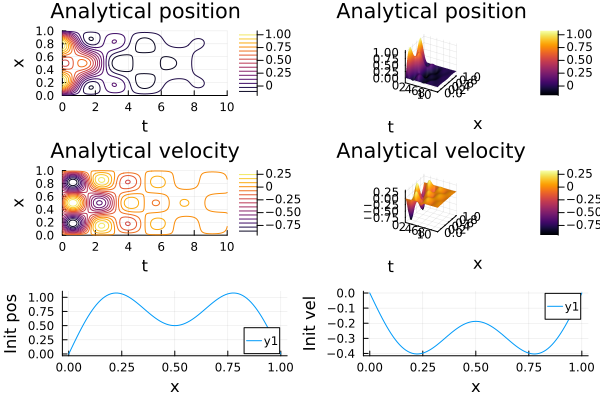

In [2]:
function genAnalyticalSolution(x,t,cosTModeAmp,c,gamma)
    
    nnodes = length(x) 
    Ntp1   = length(t)
    Nmodes = length(cosTModeAmp)
    
    uanal = zeros(nnodes,Ntp1)
    vanal = zeros(nnodes,Ntp1)
    modes = Vector(1:1:Nmodes)
    
    #..construct mode dependent vectors.. 
    alpha = [ c*n*π for n in modes]
    omega = sqrt.(alpha.^2 .- (gamma/2).^2)

    #..construct set of spatial basis vectors satisfying Dirichlet modes on both sides.. 
    X = reduce(hcat,[sin.(n*π*x) for n in modes])

    #..construct set of temporal basis vectors.. 
    CT = reduce(hcat,[exp.(-gamma/2*t).*cos.(omega[n]*t) for n in modes])
    ST = reduce(hcat,[exp.(-gamma/2*t).*sin.(omega[n]*t) for n in modes])
    
    CBasis = [ X[:,n] * Transpose(CT[:,n]) for n in modes]
    SBasis = [ X[:,n] * Transpose(ST[:,n]) for n in modes]
    
    for n in modes uanal = uanal + cosTModeAmp[n] * CBasis[n] end 
    for n in modes vanal = vanal + (-gamma/2*cosTModeAmp[n]) * CBasis[n] + (-omega[n]*cosTModeAmp[n]) * SBasis[n] end 
    
    return uanal, vanal
end 

# set number of elements in space, the number of time samples and number of modes 
nelements = 100;
Nt = 1000; 
Nmodes = 10; 
modes = Vector(1:1:Nmodes)

#..construct the 1D spatial x-mesh and the spatial modes 
nnodes = nelements+1; h = 1/nelements; h2=h*h; 
x = Vector(0:h:1); 
X = reduce(hcat,[sin.(n*π*x) for n in modes])

#..construct temporal t-mesh  
Tend = 10; dt = Tend/Nt; 
t = Vector(0:dt:Tend);

#..set wave velocity and damping coefficients 
c = .2;
gamma = .75 # 0.5 

#..construct vector of Fourier mode indices in time domain 
cosTModeAmp = zeros(size(modes))
cosTModeAmp[1] = 1; cosTModeAmp[3] = 0.5 

#..initialize and construct analytical solution 
uanal, vanal = genAnalyticalSolution(x,t,cosTModeAmp,c,gamma)

#..initialize and construct initialize position and velocity  
Vinit = zeros(nnodes); Vtinit = zeros(nnodes);
for n in modes Vinit  = Vinit  + cosTModeAmp[n] * X[:,n] end 
for n in modes Vtinit = Vtinit + (-gamma/2)*cosTModeAmp[n] * X[:,n] end 

p1 = contour(t,x,uanal)
xlabel!("t") 
ylabel!("x")
title!("Analytical position")
p2 = surface(t,x,uanal)
xlabel!("t") 
ylabel!("x")
title!("Analytical position")
p3 = contour(t,x,vanal)
xlabel!("t") 
ylabel!("x")
title!("Analytical velocity")
p4 = surface(t,x,vanal)
xlabel!("t") 
ylabel!("x")
title!("Analytical velocity")
p5 = plot(x,Vinit)
xlabel!("x") 
ylabel!("Init pos")
p6 = plot(x,Vtinit)
xlabel!("x") 
ylabel!("Init vel")

plot(p1,p2,p3,p4,p5,p6,layout=(3,2))

## Section 3: Case-(1/4): Second Analytical Solution (to be further elaborated)
Here we intend to replace homogeneous Dirichlet boundary conditions used before by periodic boundary conditions for both $u(x,t)$ and $u_x(x,t)$. 

Assume that $X_n(x) = c_n \, \cos(n \, \pi \, x) + s_n \, \sin(n \, \pi \, x)$. Assume that $(C_1): X_n(0) = X_n(1)$ and that $(C_2): \int_0^1 X_n(x) \, dx = C$. Then $(C_1): $

## Section 4: Case-(1/4): Analytical Solution: Spectral Analysis using Fast-Fourier Transform

Here we intend to look into the spectral of the analytical reference solution by a Fast Fourier Analysis in three points of the spatial domain ($x = 0.25$, $x = 0.5$ and $x = 0.75$). 
- in case that $\gamma = 0$ (no damping), a single peak in frequency domain appears. 
- in case that $\gamma \neq 0$ (no damping), the peak in frequency domain appears is smeared out. The smearing increases with the damping (cfr. FFT of a damped harmonic, provide reference here); 

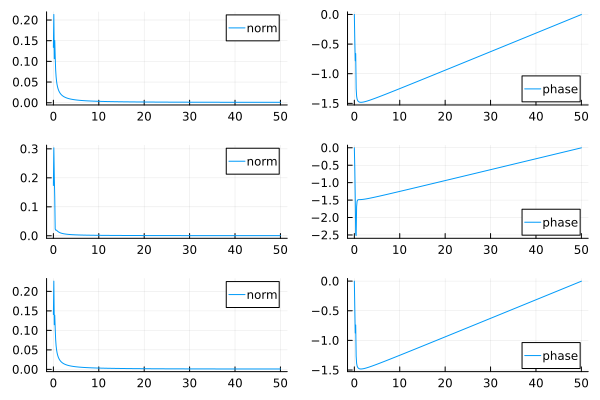

In [5]:
uanalp1 = uanal[div(nelements,4),:]
uanalp2 = uanal[div(nelements,2),:]
uanalp3 = uanal[3*div(nelements,4),:]

p1 = plot(t,uanalp1)
p2 = plot(t,uanalp2)
p3 = plot(t,uanalp3)

plot(p1,p2,p3,layout=(3,1))

# perform FFT of sampled position data 
uanalfp1 = fft(uanalp1)
uanalfp2 = fft(uanalp2)
uanalfp3 = fft(uanalp3)

#..set frequency axis 
fmax = 1/(2.0*dt)
fstep = 2*fmax/Nt
fvec = Vector(0:fstep:fmax)

#..plot absolute value of FFT samples  
p1 = plot(fvec, 2.0/Nt * abs.(uanalfp1[1:length(fvec)]),label="norm")
p2 = plot(fvec, angle.(uanalfp1[1:length(fvec)]),label="phase")
p3 = plot(fvec, 2.0/Nt * abs.(uanalfp2[1:length(fvec)]),label="norm")
p4 = plot(fvec, angle.(uanalfp2[1:length(fvec)]),label="phase")
p5 = plot(fvec, 2.0/Nt * abs.(uanalfp3[1:length(fvec)]),label="norm")
p6 = plot(fvec, angle.(uanalfp3[1:length(fvec)]),label="phase")
plot(p1, p2, p3, p4, p5, p6, layout = (3,2))

## Section 5: Spatial Discretization: Construct the One-Dimensional Matrix

In [6]:
# struct to hold entire mesh
struct Mesh
  #..number of nodes of the mesh..   
  nnodes::Int64
  #..number of elements of the mesh..
  nelements::Int64 
  #..vector of x-coordinates of nodes of the mesh..
  Nodes::Vector{Float64}
end 

# function to generate a mesh on the interval 0 <= x <= 1.   
# we limit the type of input to be Int64 
function genMesh(nelements::Int64)::Mesh
    h = 1/nelements 
    nnodes = nelements+1
    Nodes = Vector{Float64}(0:h:1)    
    mesh = Mesh(nnodes,nelements,Nodes)     
    return mesh;
end 

# generate global stiffness matrix 
function genStiffMat(mesh::Mesh)

    #..recover number of elements and nodes  
    nelements = mesh.nelements
    nnodes    = nelements+1
    
    #..set mesh width and square of mesh width 
    h = 1/nelements; h2=h*h; 

    #..construct the coefficient matrix with our the boundary conditions 
    e = ones(nnodes); #..note that ones(N+1,1) does *not* work here 
    A = Tridiagonal(-e[2:end], 2*e, -e[2:end]); 
    A = (1/h2)*A;     
   
    return A; 
    
end

function genVector(mesh, sourceFct::F) where F 

    #..recover mesh nodes  
    nodes = mesh.Nodes
    
    #..set vector values using broadcasting (dot syntax)  
    f = sourceFct.(nodes)
   
    return f; 
end

function genBoundaries!(mesh,A)
    
    #..recover number of elements and nodes  
    nelements = mesh.nelements
    nnodes = mesh.nnodes 
    
    #..set mesh width and square of mesh width 
    h = 1/nelements; h2=h*h; 
    
    #..set homogeneous Dirichlet boundary conditions at both end points  
    if (true)
        display(" Setting homogeneous Dirichet conditions on both sides")
        A[1,1] = 0.; A[1,2] = 0.; 
        A[end,end] = 0.; A[end,end-1] = 0.;
    elseif (false)
        #..set homogeneous Dirichlet left and homogeneous Neumann right
        display(" Setting homogeneous Neumann conditions on the right hand side:: Option-1")
        A[1,1] = 1.;        A[1,2] = 0.;         
        A[end,end] = 1/h ;  A[end,end-1] = -1/h;      
    elseif (false)
        #..set homogeneous Dirichlet left and homogeneous Neumann right
        display(" Setting homogeneous Neumann conditions on the right hand side:: Option-2")
        A[1,1] = 1.;        A[1,2] = 0.;         
        A[end,end] = 1/h ;  A[end,end-1] = -1/h;       
    elseif (false)
        display(" Setting periodic boundary conditions:: Option-1")
        A = sparse(A)
        A[1,end-1] = -1/h2; 
        A[end,2]   = -1/h2;
    elseif (true)
        display(" Setting periodic boundary conditions:: Option-2")
        A = sparse(A)
        A[1,end-1] = -1/h2; 
        [A[end,i] = -1. for i =1:nnodes];        
    else 
        error(" genSolution::Error::Boundary conditions not set")
    end 
    return A  
end

genBoundaries! (generic function with 1 method)

In [7]:
nelements = 10
mesh = genMesh(nelements); A = genStiffMat(mesh); A = genBoundaries!(mesh,A); 
#A = -A;

" Setting homogeneous Dirichet conditions on both sides"

In [8]:
#display(A)

## Section 6: Case-(3/4): Time Integration of the Linear Wave Propagation Problem

### Transient Simulation 

Generate mesh, stiffness matrix and right-hand side vector  

In [9]:
nelements = 100
mesh = genMesh(nelements)
myfct(x) = 0 
A = genStiffMat(mesh); f = genVector(mesh, myfct) 
A = genBoundaries!(mesh,A);

" Setting homogeneous Dirichet conditions on both sides"

Generate initial conditions and physical constants. 

Does an negative initial velocity make sence.  

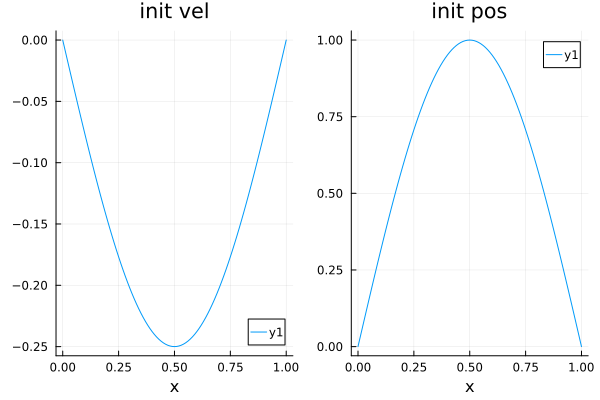

In [10]:
#..construct the 1D spatial x-mesh and the spatial modes 
X = reduce(hcat,[sin.(n*π*mesh.Nodes) for n in modes])

#..set wave velocity, damping coefficient and angular frequency of the forcing  
c       = .2;
gamma   = 0.5
omdrive = 2 * pi 

#..construct vector of Fourier mode indices in time domain 
cosTModeAmp = zeros(size(modes))
cosTModeAmp[1] = 1; cosTModeAmp[3] = 0 

#..initialize and construct initialize position and velocity  
Vinit = zeros(mesh.nnodes); Vtinit = zeros(mesh.nnodes);
for n in modes Vinit  = Vinit  + cosTModeAmp[n] * X[:,n] end 
for n in modes Vtinit = Vtinit + (-gamma/2)*cosTModeAmp[n] * X[:,n] end 

p1 = plot(mesh.Nodes,Vtinit,xlabel="x",title="init vel")
p2 = plot(mesh.Nodes,Vinit,xlabel="x",title="init pos")
plot(p1,p2)

Perform time integration 

In [48]:
function wave_system(ddu,du,u,p,t)
    mesh = p 
    ddu .= -c^2*A*u - gamma*du .+ sin(3*omdrive*t) 
    ddu[1] = 0
    ddu[end] = 0 
end

tspan = (0.0,100)

p = mesh 

prob = SecondOrderODEProblem(wave_system,Vtinit,Vinit,tspan,p)


sol = solve(prob, AutoVern7(Rodas5()), reltol = 1e-8, abstol = 1e-8, save_everystep = true);

Plot the computed solution 

In [49]:
velind = 1:mesh.nnodes; posind = mesh.nnodes+1:2*mesh.nnodes; 
Nt = length(sol.t)
V  = sol[velind,:]
p1 = contour(sol.t,mesh.Nodes,V,xlabel="t",ylabel="x")
title!("Numerical velocity")
U  = sol[posind,:]
p2 = contour(sol.t,mesh.Nodes,U,xlabel="t",ylabel="x")
title!("Numerical position")
# plot(p1, p2, layout= (1,2))
p3 = plot(mesh.Nodes,sol[velind,div(Nt,4)],xlabel="x",label="vel@T/4")
p4 = plot(mesh.Nodes,sol[posind,div(Nt,4)],xlabel="x",label="pos@T/4")
p5 = plot(mesh.Nodes,sol[velind,div(Nt,2)],xlabel="x",label="vel@T/2")
p6 = plot(mesh.Nodes,sol[posind,div(Nt,2)],xlabel="x",label="pos@T/2")
p7 = plot(mesh.Nodes,sol[velind,3*div(Nt,4)],xlabel="x",label="vel@3T/4")
p8 = plot(mesh.Nodes,sol[posind,3*div(Nt,4)],xlabel="x",label="pos@3T/4")
plot(p1, p2, p3, p4, p5, p6, p7, p8, layout = (4,2)) 

### Method of Undetermined Coefficients (Harmonic Balance Method Precursor)

System of ODEs to be solved (assuming unit mass matrix $M = I$, scalar damping coefficient $\gamma$ (other models for damping will follow later), wave speed $c$, external forcing with amplitude ${\mathbf f}_0$ and angular frequency $\omega_d$ and assuming system of size $N+1$)

$$
\ddot{ {\mathbf u} }(t) + \gamma \, \dot{ {\mathbf u} }(t) + c^2 \, A \, {\mathbf u}(t) = 
{\mathbf f}_0 \, \sin(\omega_d \, t) \text{ for internal nodes} 
$$

supplied with (homogeneous Dirichlet or periodic) boundary conditions and initial conditions. 

Assume solution of the form (method of undetermine coefficients)

$$
{\mathbf u}(t) = \mathbf{A}_c \, \cos(\omega_d \, t) + \mathbf{B}_s \, \sin(\omega_d \, t) 
$$

where $\mathbf{A}_c$ and $\mathbf{B}_s$ are vectors of amplitudes of the cos amd sin modes, respectively. We will assume here that $\mathbf{A}_c$ and $\mathbf{B}_s$ satisfy both the boundary conditions. 

Coupled system of linear equations for $\mathbf{A}_c$ and $\mathbf{B}_s$

$$
( c^2 \, A - \omega_d^2 I )\, \mathbf{A}_c   + \omega_d \, \gamma \, \mathbf{B}_s = {\mathbf 0} \\
- \omega_d \, \gamma \, \mathbf{A}_s + ( c^2 \, A - \omega_d^2 I) \, \mathbf{B}_s = {\mathbf f}_0 
$$

supplied with boundary conditions for $\mathbf{A}_c$ and $\mathbf{B}_s$. In matrix-vector form 

$$
\begin{pmatrix} c^2 \, A - \omega_d^2 I & \omega_d \, \gamma \, I  \\  
                - \omega_d \, \gamma \, I & c^2 \, A - \omega_d^2 I \end{pmatrix}
\begin{pmatrix} \mathbf{A}_c \\ \mathbf{B}_s \end{pmatrix} = 
\begin{pmatrix} \mathbf{0} \\ \mathbf{f}_0 \end{pmatrix}
$$

with row $1$, row $N+1$, row $N+2$ and row $2\,N+2$ overwritten to enforce $\mathbf{A}_c$ and $\mathbf{B}_s$ to satisfy the boundary conditions.  

In [50]:
# construct method undetermined coefficients matrix 
I = UniformScaling(1.)
AA = [ c^2*A - (3*omdrive)^2*I 3*omdrive*gamma*I ; -3*omdrive*gamma*I c^2*A - (3*omdrive)^2*I]
AA[1,:] .= 0; AA[1,1] = 1. 
AA[mesh.nnodes,:] .= 0; AA[mesh.nnodes,mesh.nnodes] = 1.
AA[mesh.nnodes+1,:] .= 0; AA[mesh.nnodes+1,mesh.nnodes+1] = 1.
AA[2*mesh.nnodes,:] .= 0; AA[2*mesh.nnodes,2*mesh.nnodes] = 1.

# construct method undetermined coefficients right-hand sid 
f = ones(mesh.nnodes); f[1] = 0; f[end] = 0; 
ff = [zeros(mesh.nnodes) ; f] 

# solve method undetermined coefficients linear system 
solhb = AA \ ff; 
Ac = solhb[1:mesh.nnodes]
Bs = solhb[mesh.nnodes+1:end];

Plot solution in space and time as a sum of cos and sine harmonic

In [51]:
W = Ac*(cos.(omdrive/5*sol.t))' + Bs*(cos.(omdrive/5*sol.t))'
contour(sol.t,mesh.Nodes,W,xlabel="t",ylabel="x")

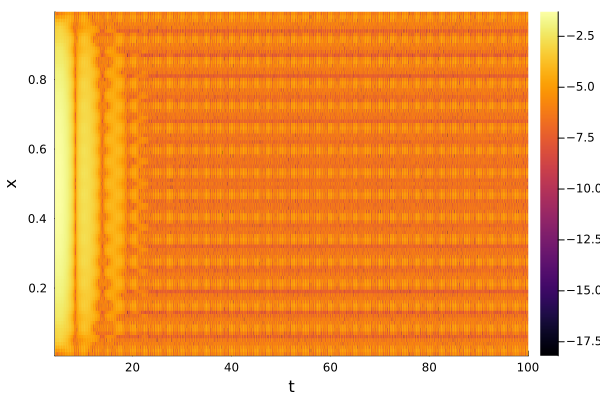

In [52]:
D = U[2:end-1,200:end]-W[2:end-1,200:end]
heatmap(sol.t[200:end],mesh.Nodes[2:end-1],log.(abs.(D)),xlabel="t",ylabel="x")

## Section 7: Case-(4/4): Time Integration of the Non-Linear Wave Propagation Problem

In [ ]:
nelements = 100 # 10
mesh = genMesh(nelements)
myfct(x) = 0 
A = genStiffMat(mesh); f = genVector(mesh, myfct) 
A = genBoundaries!(mesh,A);

In [ ]:
#..construct the 1D spatial x-mesh and the spatial modes 
X = reduce(hcat,[sin.(n*π*mesh.Nodes) for n in modes])

#..set wave velocity and damping coefficients 
c = .2;
gamma = 0.5 # 0.5 

#..construct vector of Fourier mode indices in time domain 
cosTModeAmp = zeros(size(modes))
cosTModeAmp[1] = 1; cosTModeAmp[3] = 0 

#..initialize and construct initialize position and velocity  
Vinit = zeros(mesh.nnodes); Vtinit = zeros(mesh.nnodes);
for n in modes Vinit  = Vinit  + cosTModeAmp[n] * X[:,n] end 
for n in modes Vtinit = Vtinit + (-gamma/2)*cosTModeAmp[n] * X[:,n] end 

p1 = plot(mesh.Nodes,Vtinit,xlabel="x",title="init vel")
p2 = plot(mesh.Nodes,Vinit,xlabel="x",title="init pos")
plot(p1,p2)

In [ ]:
function wave_system(ddu,du,u,p,t)
    mesh = p 
    # ddu .= -u # decoupled system of mass-spring-dampers 
    # Fd = 2*u.*du.*(u.>0) - 2*u.*du.*(u.<0) 
    # Fd = abs.(du).*du 
    # c^2*A*u  
    # c^2*A*u - gamma*du
    # c^2*A*u - u.*du
    # ddu .= -c^2*A*u - gamma*du .+ 500*sin(2*π*t) .- 5e-5*(t*(t<1)+(t>=1))*(u - mesh.Nodes).^3 
    ddu .= -c^2*A*u - gamma*du .+ 500*sin(2*π*t) .- 5e0*(t*(t<1)+(t>=1))*(u - mesh.Nodes).^3 
    # ddu .= -c^2*A*u - gamma*du
    ddu[1] = 0
    ddu[end] = 0 
    # c^2*A*u - 10*Fd .+ 500*sin(2*π*3*t)
end

# tspan = (0.0,10)
# tspan = (0.0,50)
# tspan = (0.0,50)
tspan = (0.0,50)

p = mesh 

prob = SecondOrderODEProblem(wave_system,Vtinit,Vinit,tspan,p)
# sol = solve(prob, AutoVern7(Rodas5()), reltol = 1e-2, abstol = 1e-2, save_everystep = true);
# sol = solve(prob, AutoVern7(Rodas5()), reltol = 1e-4, abstol = 1e-4, save_everystep = true);
sol = solve(prob, AutoVern7(Rodas5()), reltol = 1e-8, abstol = 1e-8, save_everystep = true);

In [ ]:
velind = 1:mesh.nnodes; posind = mesh.nnodes+1:2*mesh.nnodes; 
Nt = length(sol.t)
V  = sol[velind,:]
p1 = contour(sol.t,x,V)
title!("Numerical velocity")
U  = sol[posind,:]
p2 = contour(sol.t,x,U)
title!("Numerical position")
# plot(p1, p2, layout= (1,2))
p3 = plot(sol[velind,div(Nt,4)],label="1/4 vel")
p4 = plot(sol[posind,div(Nt,4)],label="1/4 pos")
p5 = plot(sol[velind,div(Nt,2)],label="1/2 vel")
p6 = plot(sol[posind,div(Nt,2)],label="1/2 pos")
p7 = plot(sol[velind,3*div(Nt,4)],label="3/4 vel")
p8 = plot(sol[posind,3*div(Nt,4)],label="3/4 pos")
plot(p1, p2, p3, p4, p5, p6, p7, p8, layout = (4,2)) 

In [ ]:
uanal, vanal = genAnalyticalSolution(x,sol.t,cosTModeAmp,c,gamma); 
contour(abs.(V - vanal))

## Section 8: Case-(4/4): Spectral Analysis of Time Traces using FFT  

In [ ]:
unump1 = U[div(nelements,4),:]
unump2 = U[div(nelements,2),:]
unump3 = U[div(3*nelements,4),:]

p1 = plot(sol.t,unump1)
p2 = plot(sol.t,unump2)
p3 = plot(sol.t,unump3)
plot(p1,p2,p3,layout=(3,1)) 

In [ ]:
# perform FFT of sampled position data 
unumfp1 = fft(unump1)
unumfp2 = fft(unump2)
unumfp3 = fft(unump3)

#..set frequency axis 
fmax = 1/(2.0*dt)
fstep = 2*fmax/Nt
fvec = Vector(0:fstep:fmax)

#..plot absolute value of FFT samples  
p1 = plot(fvec, 2.0/Nt * abs.(unumfp3[1:length(fvec)]),label="norm")
p2 = plot(fvec, angle.(unumfp3[1:length(fvec)]),label="phase")
plot(p1, p2)

## Section 9: Case-(4/4): Harmonic Balance Method using Newton Non-Linear Solve 

### Define the Mismatch 

In [ ]:
function  mismatch(x,p)
    mesh = p  
    Np1  = mesh.nnodes  
    Ac  = @view x[1:Np1]
    Bs  = @view x[Np1+1:end]
    m, om0, omd, ga, stiffnlin, F0 = p
    m, om0, omd, ga, stiffnlin, F0 = p 
    mismathvec = zeros(eltype(x),2*Np1)
    mismathvec = AA * x - ff
    for i=1:Np1 
        mismathvec[i]     + = stiffnlin*.75*(Ac[i]^3 + Ac[i]*Bs[i]^2) 
        mismathvec[Np1+i] + = stiffnlin*.75*(Bs[i]^3 + Ac[i]^2*Bs[i]) - F
    end 
    return mismathvec 
end 

### Minimize the Mismatch 

In [ ]:
prob = NonlinearProblem(mismatch, [Aampl,Bampl], p)
solnl = solve(prob, NewtonRaphson())
display("Computed cos amplitude = "); display(solnl.u[1])
display("Computed sin amplitude = "); display(solnl.u[2])
display("Computed nrm amplitude = "); display(norm(solnl.u))

## Section 10: Sandbox 

### Formulation as System of Coupled Equations 

In progress at [notebook on system-first-order-wave](./system-first-order-wave.ipynb).

### Scalar Linear and Non-Linear First Order PDE in 1D Space and Time: Burgers Equation 

Problem formulation: linear scalar wave equation with constant velocity $c_0$ given by $u_t(x,t) + c_0 u_x(x,t) = 0$ for $0 \leq x \leq 1$ and $0 \leq t \leq T$ supplied with periodic boundary conditions $u(0,t) = u(1,t)$ and initial conditions $u(x,t=0) = u_0(x)$.

Solve analytically: method of characteristics. Set $\xi = x - c_0 t$. Then $u_x = u_{\xi}$ and $u_t = - c_0 u_{\xi}$. Any function $u(\xi) = u(x - c_0 t)$ is solution. This function represents a profile (wave) moving from left to right.  

Solve using e.g. finite difference or finite volume method in space (uniform mesh is fine) followed by time integration applied to the semi-discrete (discrete in space and continuous in time) system. You can build time-integration routine from scratch or use DifferentialEquations.jl. Alternatively, use out-of-the box solutions such as [trixi.jl](https://trixi-framework.github.io). Expect numerical dispersion to occur unless some form of diffusion is added to the equations.  

Repeat above for heat equation $u_t = u_{xx}$ plus boundary and initial conditions. 

Repeat above for linear convection-diffusion equation $u_t + c_0 u_x(x,t) = u_{xx}$ plus boundary and initial conditions.

Repeat above for non-linear convection-diffusion equation $u_t + u \, u_x(x,t) = u_{xx}$ plus boundary and initial conditions. The transport term is non-linear.

[Burgers Eqn Example](https://docs.sciml.ai/SciMLBenchmarksOutput/html/MOLPDE/burgers_spectral_wpd.html)

## References 

1. Seperation of variables applied to the damped wave equation [lecture notes](https://www.math.hmc.edu/~ajb/PCMI/lecture7.pdf); 
2. Example of non-linear acoustics [model](https://www.comsol.com/model/nonlinear-propagation-of-a-cylindrical-wave-verification-model-88771); 